In [2]:
import os
import re 
import json

import numpy as np
import cv2
from matplotlib import pyplot as plt
import h5py

## Calculate & visualize img2img and text2img similarity for Cogent & POI images

#### First merge all CoGent json files into one big dict based on the img filenames

In [3]:
data_dir = 'dataset/cogent'
json_dir = os.path.join(data_dir, 'data')
img_dir = os.path.join(data_dir, 'images_resized')


img_fnames = set(os.listdir(img_dir))

json_data = {}

for dirname in os.listdir(json_dir):
    
    if 'collection-' in dirname:
        if dirname.endswith('.zip'):
            continue
        print(dirname)
        dir_path = os.path.join(json_dir,dirname)
        json_filenames = os.listdir(dir_path)
        print('Total json files:',len(json_filenames))
        
        for fname in json_filenames:
            if fname.endswith('.json'):
                
                with open(os.path.join(dir_path,fname)) as f:
                    data = json.load(f)
                    img_fname = data['primary_transcode']
                    if img_fname is None:
                        continue
                    
                    if not img_fname.endswith('.jpg'):
                        continue
                    
                    if img_fname not in img_fnames:
                        print('img not found?',img_fname)
                    else:
                        json_data[img_fname] = data
                    
print('Total files in json data:',len(json_data))                
        


collection-stam
Total json files: 9396
collection-alijn
Total json files: 10000
collection-archief
Total json files: 9402
collection-industrie
Total json files: 8431
collection-design
Total json files: 2186
Total files in json data: 39091


#### Load all pois

In [4]:
merged_path = os.path.join(data_dir, 'all_pois.json')

with open(merged_path) as f:
    pois = json.load(f)
     
print('Total pois:',len(pois))    

Total pois: 5757


In [ ]:
pois_tourism = [p for p in pois_merged if 'tourism' in p]

pois_parks = [p for p in pois_merged if p.get('leisure') == 'park']

pois_filtered = []
'''
for p in pois_tourism:
    if p['tourism'] == 'artwork':
        if 'artwork_type' in p and p['artwork_type'] == 'graffiti':
            continue
            
    if p['tourism'] == 'hotel':
        continue
    if p['tourism'] == 'guest_house':
        continue  
    if p['tourism'] == 'apartment':
        continue         
    if p['tourism'] == 'hostel':
        continue  
    if 'name' not in p:
        continue
    pois_filtered.append(p)
'''
for p in pois_parks:
    if 'name' not in p:
        continue
    pois_filtered.append(p)

print('Total number of pois:',len(pois_tourism))
print('Pois filtered:',len(pois_filtered))

Total number of pois: 365
Pois filtered: 78


In [6]:
def read_resize_img(path):
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (600,600))
    return img


def get_poi(pois, fname):
    
    uid = int(fname.split('_',1)[0])
    return [p for p in pois if p['uid'] == uid][0]


def img_similarity(feature, features):
    
    f = feature[0]
    features = features[:,0]
    
    return f @ features.T


def most_similar(feature, features, k=100):
    
    f = feature[0]
    features = features[:,0]
    sims = f @ features.T
    s = np.argsort(-sims)[:k]
    return s, sims[s]


def most_similar_text(text_feature, features, k=100):
    
    text_feature = text_feature[:,0]
    sims = features @ text_feature.T
    print(sims.shape, sims.max())
    sims = sims.squeeze().max(axis=1)

    s = np.argsort(-sims)[:k]
    return s, sims[s]
        
    

### Load image features for both datasets

In [5]:
img_dir = os.path.join(data_dir, 'images_resized')
poi_img_dir = os.path.join(data_dir, 'poi_images')

h5_path = os.path.join(data_dir, 'blip2_image_features.h5')
poi_h5_path = os.path.join(data_dir, 'poi_image_features.h5')


features = None
filenames = None

poi_features = None
poi_filenames = None

with h5py.File(h5_path, "r") as h5:
    print('Reading cogent image features')
    # Print all root level object names (aka keys) 
    # these can be group or dataset names 
    print("Keys: %s" % h5.keys())
    
    filenames = h5['filenames']
    features = h5['features']
    print(filenames.shape, filenames.dtype, type(filenames))
    print(features.shape, features.dtype, type(features))
    
    features = np.array(features, dtype=np.float32)
    filenames = np.array(filenames)
    
with h5py.File(poi_h5_path, "r") as h5:
    print('Reading poi image features')
    # Print all root level object names (aka keys) 
    # these can be group or dataset names 
    print("Keys: %s" % h5.keys())
    
    poi_filenames = h5['filenames']
    poi_features = h5['features']
    print(poi_filenames.shape, poi_filenames.dtype, type(poi_filenames))
    print(poi_features.shape, poi_features.dtype, type(poi_features))
    
    poi_features = np.array(poi_features, dtype=np.float32)
    poi_filenames = np.array(poi_filenames)
    
# binary to string
filenames = [f.decode('utf-8') for f in filenames]
poi_filenames =  [f.decode('utf-8') for f in poi_filenames]

Reading cogent image features
Keys: <KeysViewHDF5 ['features', 'filenames']>
(39091,) object <class 'h5py._hl.dataset.Dataset'>
(39091, 32, 256) float32 <class 'h5py._hl.dataset.Dataset'>
Reading poi image features
Keys: <KeysViewHDF5 ['features', 'filenames']>
(599,) object <class 'h5py._hl.dataset.Dataset'>
(599, 32, 256) float32 <class 'h5py._hl.dataset.Dataset'>


### Similarity between cogent images

Current query image: Adreskaart van kleermaker Carpentier - De Rouck, Gent
Best matches:
1 Adreskaart van kleermaker Carpentier - De Rouck, Gent
2 Adreskaart van kleermaker en verkoper van kleding Carpentier - Derouck, Gent
3 Adreskaart van restaurant- en feestzaalhouder Albert Verkercke, Gent
4 Adreskaart van kapper en verkoper van parfum en kledingaccessoires Jh. Potié, Gent
5 Adreskaart van banketbakker, snoepmaker en verkoper van voedingswaren P. Salzgeber, Gent
6 Visitekaart van textielfabriek La Lys in Gent
7 Adreskaart van scheepsbouwer J. De Landstheer, Gent
8 Aankondiging van de verhuizing van banketbakker en snoepmaker P. Salzgeber, Gent
9 Adreskaart van restaurant- en feestzaalhouder Albert Verkercke, Gent
10 Adreskaart van banketbakker en snoepmaker en verkoper van voedingswaren P. Salzgeber, Gent


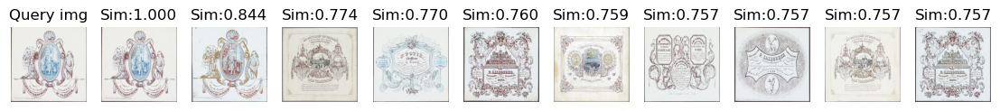

Current query image: Aankondiging van de verhuizing van de hoeden- en stoffenwinkel van Louis Verschorren, Gent
Best matches:
1 Aankondiging van de verhuizing van de hoeden- en stoffenwinkel van Louis Verschorren, Gent
2 Adreskaart en Aankondiging van de verhuizing van de hoeden- en stoffenwinkel van Louis Verschorren, Gent
3 Aankondiging van de verhuizing van de hoeden- en stoffenwinkel van Louis Verschorren, Gent
4 Aankondiging van de verhuizing van de hoeden- en stoffenwinkel van Louis Verschorren, Gent
5 Aankondiging van de verhuizing van de hoeden- en stoffenwinkel van Louis Verschorren, Gent
6 Adreskaart van hoeden- en mutsenwinkel J. F. Langerock, Gent
7 Adreskaart van zadelmaker voor burger en militair P. J. Winckelmans, Gent
8 Adreskaart van winkel van speelgoed en luxeartikelen Au Chinois, Gent
9 Adreskaart van slager E. Van Loo – Migeon, Gent
10 Adreskaart van zadelmaker voor burger en militair P. J. Winckelmans, Gent


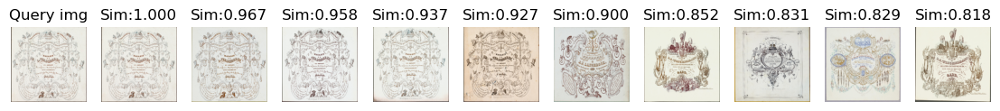

Current query image: Kinderbrenger
Best matches:
1 Kinderbrenger
2 Kinderbrenger
3 Koppel met baby
4 Koppel bij baby in wieg
5 Kinderbrengster met twee emmers baby's
6 Gilbert komt aan bij bruid met bruidsboeket, Wondelgem, 1967
7 Gelukkig Nieuwjaar
8 Bruidegom Achiel komt aan bij bruid, Zandbergen, 1960
9 Bruidegom Rudi komt aan met bruidsboeket, Gentbrugge, 1967
10 Primus poseert met geschenken, 1953


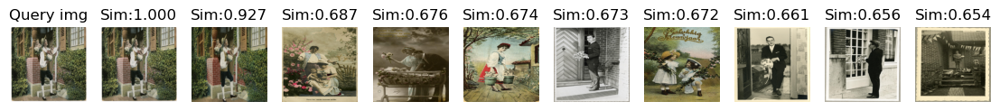

Current query image: Etalage van elektrozaak Moerman in Gent
Best matches:
1 Etalage van elektrozaak Moerman in Gent
2 Etalage van bakkerij Dehaeck in Gent
3 Etalage van behangpapierwinkel Modern Behang in Gent
4 Etalage van elektrozaak G. Feys in Gent
5 Etalage van dagbladhandel De Brug en kledingwinkel Yellow in Gent
6 Gevel van café De Zwaan in Gent
7 Etalages van optiek Trioptic en Winsel vloerbekleding in Gent
8 Etalage van tapijten- en handwerkwinkel Penelope in Gent
9 Etalage van woonwinkel Landy en een winkel met stripverhalen in Gent
10 Etalage van een winkel van slagerijbenodigdheden H. Duhameau in Gent


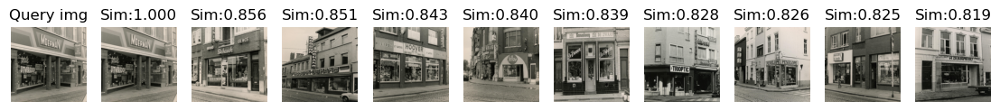

Current query image: Chinese munt
Best matches:
1 Chinese munt
2 Chinese munt
3 Chinese munt
4 Chinese munt
5 Chinese munt
6 Chinese munt
7 Chinese munt
8 Chinese munt
9 Chinese munt
10 Chinese munt


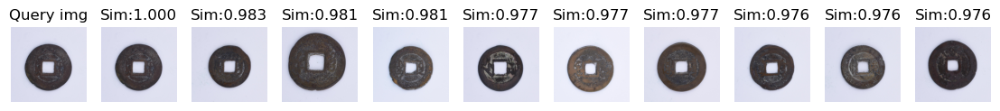

In [10]:
k = 10
indexes = np.arange(len(features))
np.random.shuffle(indexes)
for i in range(5):

    i = indexes[i]
    fname = filenames[i]
    img_path = os.path.join(img_dir, fname)
    title = json_data[fname]['title'][0]['value']
    print('Current query image:',title)
    
    f = features[i]
    
    best_matches, best_sims = most_similar(f, features, k=k)
    
    plt.figure(figsize=(14,20))
    plt.subplot(1,k+1,1)
    plt.imshow(read_resize_img(img_path))
    plt.axis('off')
    plt.title('Query img')
    print('Best matches:')
    for j in range(len(best_matches)):
        idx = best_matches[j]
        sim = best_sims[j]
        
        fname = filenames[idx]
        title = json_data[fname]['title'][0]
        print(j+1,title['value'])
        img_path = os.path.join(img_dir, filenames[idx])
        plt.subplot(1,k+1,j+2)
        plt.imshow(read_resize_img(img_path))
        plt.axis('off')
        plt.title(f'Sim:{sim:.3f}',fontsize=12)
    plt.show()

### Similarity between poi images and the cogent dataset

534 539
Current poi: Louis Van Houtte
['398_0.jpg', '398_1.jpg', '398_2.jpg', '398_3.jpg', '398_4.jpg']
(32, 256)


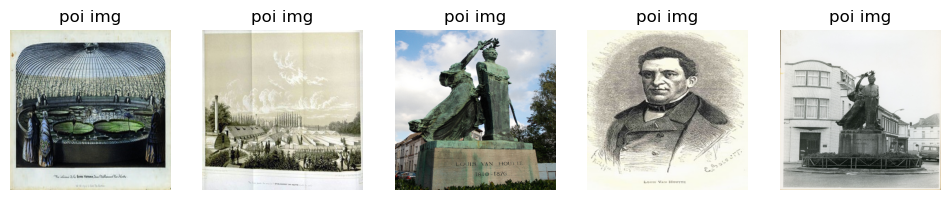

1 Gent: Charles De Kerchovelaan, zonder datum
2 Gent: Lieven Bauwensplein: standbeeld van Lieven Bauwens en Sint-Baafskathedraal, voor 16 februari 1921
3 Adreskaart van linnen- en katoenfabriek Société Linière Gantoise, Gent
4 Adreskaart van linnen- en katoenfabriek Société Linière Gantoise, Gent
5 Gent: Charles De Kerchovelaan: monument, voor 1919
6 Gent: Godshuizenlaan: Bijlokeabdij (Bijlokemuseum, nu STAM), zonder datum
7 Adreskaart van vervaardiger en plaatser van serres in ijzer Frs. Van De Cappelle - De Pretter, Gent
8 Gent: landelijke Ekkergem met Rasphuis (centraal in beeld) en Sint-Martinuskerk (uiterst rechts)
9 Gent: Begijnhoflaan: standbeeld van Joseph Guislain, 10 juli 1887
10 Adreskaart van vervaardiger en plaatser van serres Frs. Van De Cappelle - De Pretter, Gent


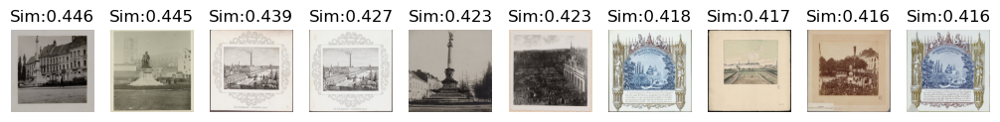

20 25
Current poi: Rommelwaterpark
['4_0.jpg', '4_1.jpg', '4_2.jpg', '4_3.jpg', '4_4.jpg']
(32, 256)


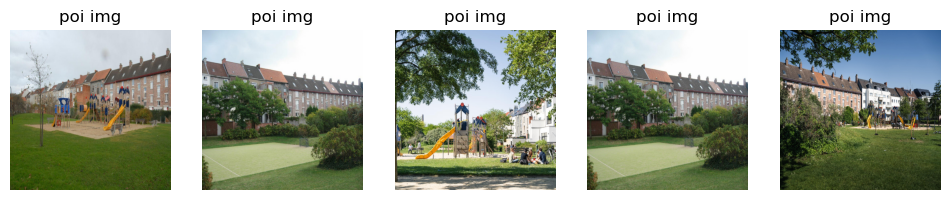

1 Gent: Godshuishammeke, 1975-1990
2 Sint-Elisabethbegijnhof, Gent
3 Gent: Godshuishammeke, 1975-1990
4 Gent: Godshuishammeke, 1975-1990
5 Gent: Godshuishammeke, 1975-1990
6 Gent: Godshuishammeke, 1975-1990
7 Luchtfoto van textielfabriek La Linière Gantoise in Gent
8 Gent: Godshuishammeke, 1975-1990
9 Sint-Elisabethbegijnhof, Gent
10 Gent: Godshuishammeke, 1975-1990


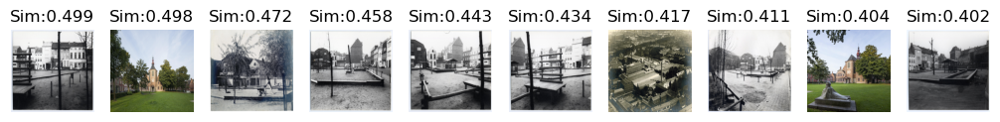

125 130
Current poi: Citadelpark
['25_0.jpg', '25_1.jpg', '25_2.jpg', '25_3.jpg', '25_4.jpg']
(32, 256)


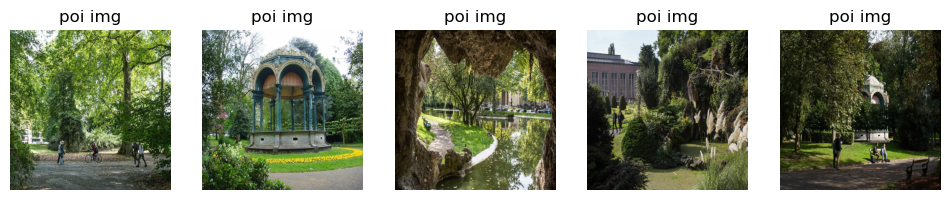

1 Gent: Baudelohof, zonder datum
2 Gent: Koningin Astridlaan: Flandria Palace Hotel, zonder datum
3 Gent: Dierentuinlaan (nu Franklin Rooseveltlaan): dierentuin van Gent, zonder datum
4 Vue perspective d'un superbe bosquet
5 Gent: Coupure: Leie, voor 1917
6 Gent: Lange Violettestraat: Klein Begijnhof Onze-Lieve-Vrouw Ter Hoyen, zonder datum
7 Nieuwjaarskaart Société Royale d’Histoire Naturelle, Gent, 1885
8 Gent: Muinkpark: dierentuin van Gent, zonder datum
9 Gent: Koningin Astridlaan: Flandria Palace Hotel, zonder datum
10 Nieuwjaarskaart Société Royale d’Histoire Naturelle, Gent, 1864


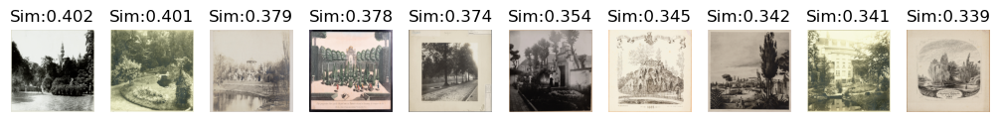

105 110
Current poi: Bloemekenspark
['21_0.jpg', '21_1.jpg', '21_2.jpg', '21_3.jpg', '21_4.jpg']
(32, 256)


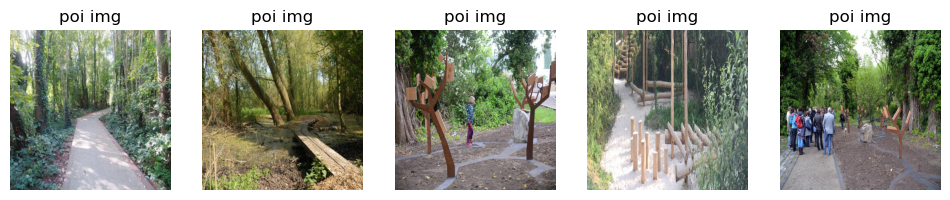

1 Speelgoeddecor natuurlandschap
2 Park met zwembad van van Rijkstehuis voor Schipperskinderen in Evergem
3 Mariakerke: Guldenroedestraat, 1975-1990
4 Gent: Godshuishammeke, 1975-1990
5 Gent: Godshuishammeke, 1975-1990
6 Gent: Godshuishammeke, 1975-1990
7 Gent: Godshuishammeke, 1975-1990
8 Sint-Gerulfuskerk, Drongen
9 Gent: Coupure: Leie, voor 1917
10 Gent: Drongensesteenweg, 1975-1990


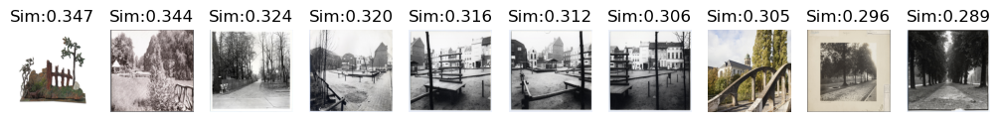

299 304
Current poi: Reigerspark
['60_0.jpg', '60_1.jpg', '60_2.jpg', '60_3.jpg', '60_4.jpg']
(32, 256)


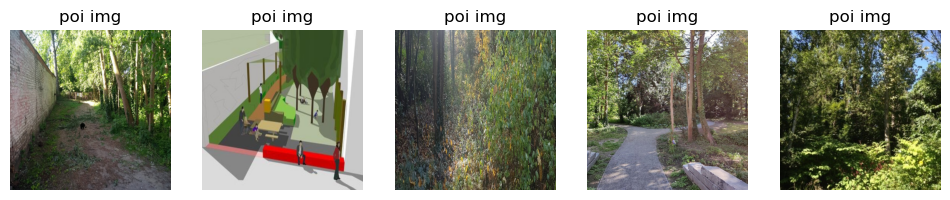

1 Gent: Coupure: Leie, voor 1917
2 Gent: Drongensesteenweg, 1975-1990
3 Gent: Koningin Astridlaan: Flandria Palace Hotel, zonder datum
4 Mariakerke: Guldenroedestraat, 1975-1990
5 Gent - uit de reeks Citybooks - verlichte weg langsheen kanaal
6 Speelgoeddecor natuurlandschap
7 Beluik gelegen in de Groenebriel in Gent
8 Gent: Hubert Frère-Orbanlaan, zonder datum
9 Zicht op de Rietgracht in de omgeving van de Afrikalaan in Gent
10 Fotograaf Arnold Vander Haeghen op zijn fiets, Gent, 1900


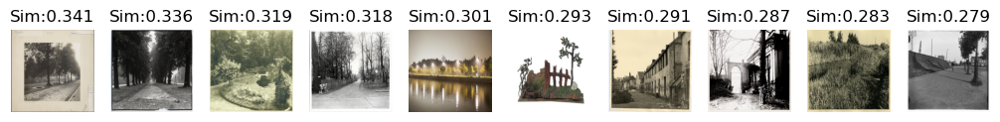

145 150
Current poi: André De Smulpark
['29_0.jpg', '29_1.jpg', '29_2.jpg', '29_3.jpg', '29_4.jpg']
(32, 256)


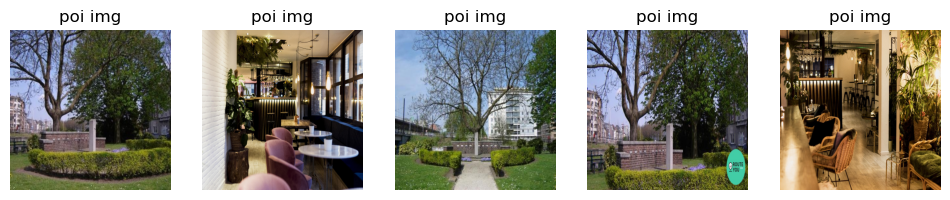

1 Gent: Coupure: Leie, voor 1917
2 Gent: Begijnhofdries: Oud Begijnhof Sint-Elisabeth, zonder datum
3 Gent: Baudelohof, zonder datum
4 Gent: Gebroeders De Smetstraat, 1975-1990
5 Gent: Emile Braunplein: parkje, augustus 1908
6 Gent: Begijnhofdries, 1975-1990
7 Gent: Veldstraat 55: Hotel D'Hane Steenhuyse, Informatiecentrum voor Stadsvernieuwing: tentoonstelling gevels, 1975-1990
8 Gent: Godshuishammeke, 1975-1990
9 Gent: Lange Violettestraat: Klein Begijnhof Onze-Lieve-Vrouw Ter Hoyen, 3 april 1890
10 Gent: Charles De Kerchovelaan, zonder datum


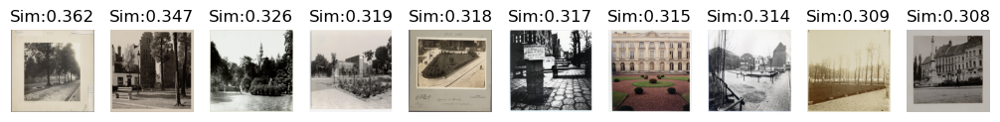

334 339
Current poi: Zuiderpoortpark
['67_0.jpg', '67_1.jpg', '67_2.jpg', '67_3.jpg', '67_4.jpg']
(32, 256)


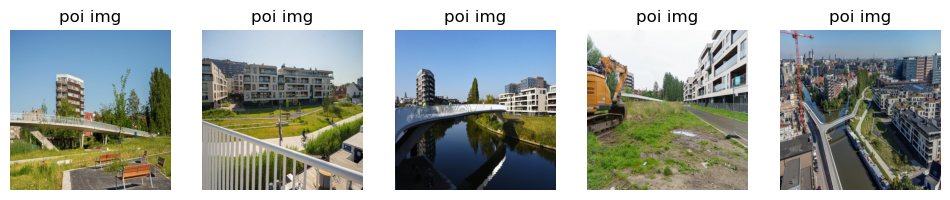

1 Gent: Drongensesteenweg: Drongenbrug, 2 juni 1978
2 Sint-Niklaaskerk, Gent
3 Sint-Gerulfuskerk, Drongen
4 Gent: Graslei, Korenlei en Grasbrug, zonder datum
5 Gent: Rozemarijnstraat: opgeblazen Rozemarijnbrug, juli 1940
6 Gent: Hamerstraat: opgeblazen Hamerbrug, juli 1940
7 Gent: Graslei, februari 1904
8 Waterwerken aan de Coupure Links in Gent
9 Waterwerken aan de Coupure Links in Gent
10 Gent: Graslei, Korenlei en Grasbrug, zonder datum


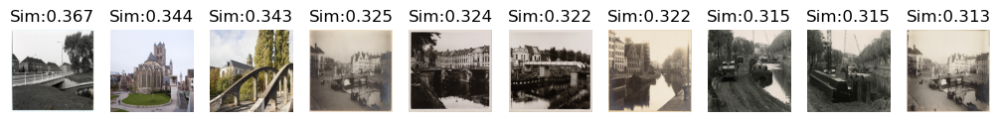

549 554
Current poi: De voorbijganger
['406_0.jpg', '406_1.jpg', '406_2.jpg', '406_3.jpg', '406_4.jpg']
(32, 256)


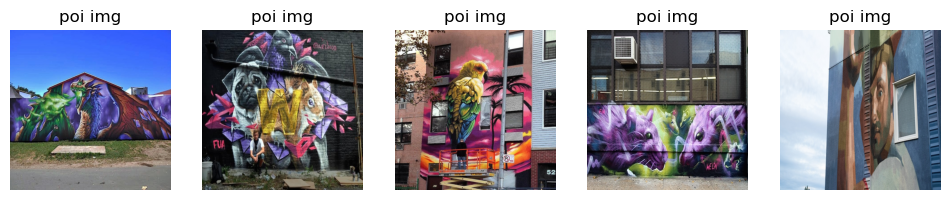

1 Circus Demuynck, 1946
2 Blazoen met Pegasus op de Helicon
3 Gevel met garagepoort in Gent
4 Promotiewagen van het Nieuwe Piste Circus, 1988
5 Gent: Godshuizenlaan: Bijlokeabdij (Bijlokemuseum, nu STAM), zonder datum
6 Tegel, doodshoofd met vleugels
7 Burgerwacht
8 1er Avril
9 Fragment van een tegel in aardewerk
10 Clown in act met boerderij, Nieuw Circus, Gent, 1937


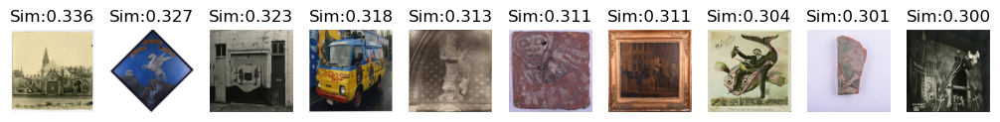

85 90
Current poi: Speelterrein wasstraat
['17_0.jpg', '17_1.jpg', '17_2.jpg', '17_3.jpg', '17_4.jpg']
(32, 256)


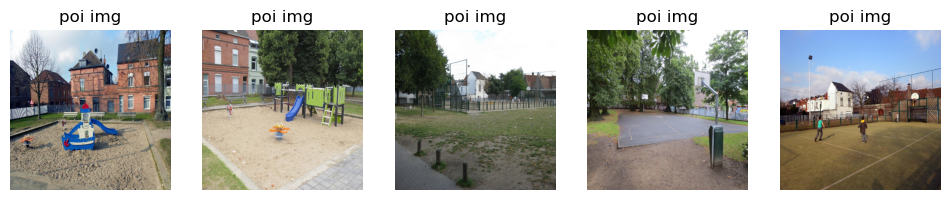

1 Gent: Godshuishammeke, 1975-1990
2 Gent: Godshuishammeke, 1975-1990
3 Gent: Godshuishammeke, 1975-1990
4 Gent: Godshuishammeke, 1975-1990
5 Gent: Godshuishammeke, 1975-1990
6 Gent: Gebroeders De Smetstraat, 1975-1990
7 Gent: Godshuishammeke, 1975-1990
8 Gent: Godshuishammeke, 1975-1990
9 Gent: Godshuishammeke, 1975-1990
10 Kinderen spelen, Gent


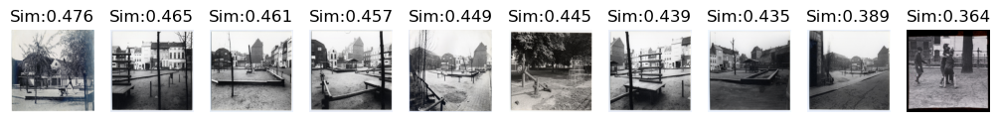

579 584
Current poi: Edmond van Beveren
['416_0.jpg', '416_1.jpg', '416_2.jpg', '416_3.jpg', '416_4.jpg']
(32, 256)


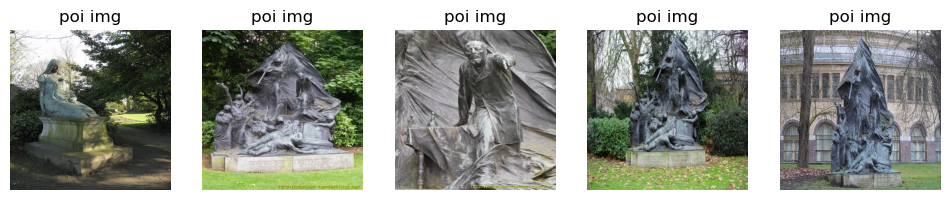

1 Gent: Begijnhofdries: monument Georges Rodenbach, na 1903
2 Gent: Casinoplein: monument Karel Miry, zonder datum
3 Sint-Elisabethbegijnhof, Gent
4 Gent: Lieven Bauwensplein: standbeeld van Lieven Bauwens en Sint-Baafskathedraal, voor 16 februari 1921
5 Tafereel
6 Gent: Geldmunt: gedenkplaat Eerste Wereldoorlog, zonder datum
7 Gent: Borluutstraat (nu Belfortstraat) en hoek Hoogpoort: huis Jacob van Artevelde, zonder datum
8 Gent: Emile Braunplein: Fontein der Geknielden, februari 1940
9 Gent: Begijnhoflaan: standbeeld van Joseph Guislain, februari 1940
10 Gent: Lieven Bauwensplein: standbeeld van Lieven Bauwens en Sint-Baafskathedraal, voor 16 februari 1921


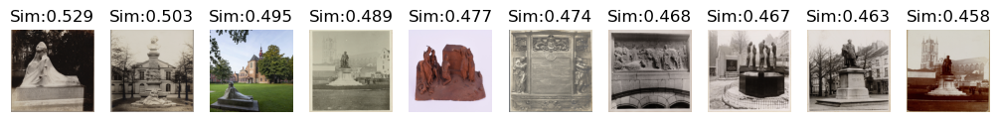

In [59]:
k = 10
img_per_poi = 5
indexes = np.arange(len(poi_features))

np.random.shuffle(indexes)


for i in range(10):

    i = indexes[i]
    poi_fname = poi_filenames[i]
    
    # get first and last index of poi
    uid = poi_fname.split('_')[0]
    tmp = uid + '_0.jpg'
    idx1 = poi_filenames.index(tmp)
    idx2 = idx1
    while True:
        uid2 = poi_filenames[idx2].split('_')[0]
        
        if uid2 != uid:
            break
        
        idx2 += 1
    
    print(idx1,idx2)
    
    
    print('Current poi:',get_poi(pois,poi_fname)['name'])
    print(poi_filenames[idx1:idx2])
    
    poi_f_avg = np.mean(poi_features[idx1:idx2], axis=0)
    print(poi_f_avg.shape)
    best_matches, best_sims = most_similar(poi_f_avg, features, k=k)
    
    plt.figure(figsize=(12,14))
    for j in range(idx2-idx1):
        
        img_path = os.path.join(poi_img_dir, poi_filenames[idx1+j])
        plt.subplot(1,img_per_poi,j+1)
        plt.imshow(read_resize_img(img_path))
        plt.axis('off')
        plt.title('poi img')
    plt.show()
    
    plt.figure(figsize=(14,20))
    for j in range(len(best_matches)):
        idx = best_matches[j]
        sim = best_sims[j]
        
        fname = filenames[idx]
        title = json_data[fname]['title'][0]
        print(j+1,title['value'])
        img_path = os.path.join(img_dir, filenames[idx])
        plt.subplot(1,k+1,j+1)
        plt.imshow(read_resize_img(img_path))
        plt.axis('off')
        plt.title(f'Sim:{sim:.3f}',fontsize=12)
    plt.show()

In [61]:
# setup device to use
device = torch.device("cuda") if torch.cuda.is_available() else "cpu"

model, vis_processors, txt_processors = load_model_and_preprocess(name="blip2_feature_extractor", model_type="pretrain", is_eval=True, device=device)

### Similarity between text input and cogent/poi images

In [ ]:
keywords = ['baroque','flower','garden','cycling','fries','chocolate','architecture','Ghent']
k=10

captions = []

for keyw in keywords:
    captions.append(keyw)

text_inputs = [txt_processors["eval"](c) for c in captions]
samples =  [{"text_input": [t]} for t in text_inputs]
features_text = [model.extract_features(s, mode="text") for s in samples]
features_text = [f.text_embeds_proj.cpu().numpy() for f in features_text]


Caption: baroque
Text features: (1, 3, 256)
(599, 32, 1) 0.31626123
1 Maaseikplein
2 De Stervende Gladiator
3 Hippolyte Metdepenningen
4 De school van toen
5 Caermersklooster
6 Jan Frans Willems
7 Park de Pélichy
8 Edmond van Beveren
9 Groenzone Tuinwijk Malem
10 Geketende Slaven


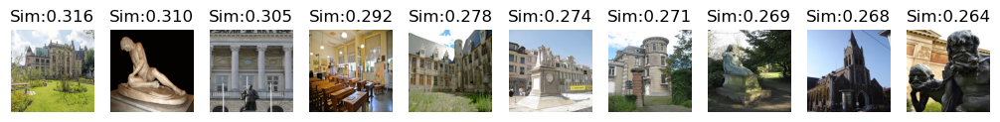

(39091, 32, 1) 0.4059161
1 Portret van een man, voorzitter van de Maatschappij voor Nijverheid en Wetenschap
2 Onze Lieve Vrouwgeboortekerk, Desteldonk
3 Portret van J. Spilthoorn, voorzitter van de Maatschappij voor Nijverheid en Wetenschap
4 Portret van Crimbrouc, ondervoorzitter van de Maatschappij voor Nijverheid en Wetenschap
5 Gent: Veldstraat: Hotel D'Hane Steenhuyse: interieur, 1975-1990
6 Hoekbeslag met acanthus
7 Consoletafel met hindepoten
8 Karmelietenkerk, Gent
9 Hoekbeslag met acanthus
10 Fragment van een sierelement


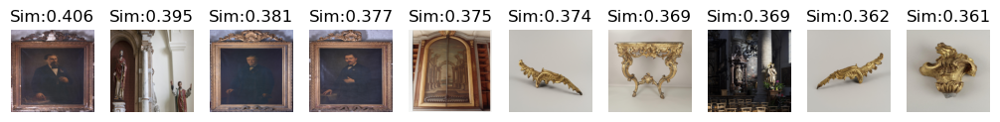

Caption: flower
Text features: (1, 3, 256)
(599, 32, 1) 0.27532524
1 Maaseikplein
2 Park Meierij
3 Louis Van Houtte
4 De Stervende Gladiator
5 Buurtpark Duifhuisstraat
6 Zuiderpoortpark
7 Gedenkbeeld vermiste personen
8 Sint-Baafskouter
9 Koning Albertpark
10 Ros Beiaard


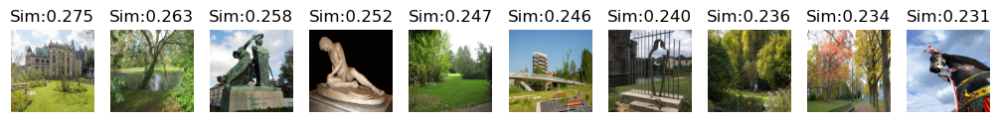

(39091, 32, 1) 0.37663066
1 Joyeuses Pâques
2 Vaas, roze achtergrond, personages in reliëf, gebroeders Ho-ho
3 Vaas met bloemen en kinderen
4 Gelukkig Nieuwjaar
5 Schoolportret jongen, Sint-Jozef jongensschool Gent, ca. 1958
6 Mand met doopsuikerdoosjes, 1987
7 Edith en Gilbert snijden bruidstaart aan, Sint-Amandsberg, 1966
8 1er Avril
9 Gent: adres onbekend: tuinbouwbedrijf: serre met plantenkweker, 1975-1990
10 1er Avril


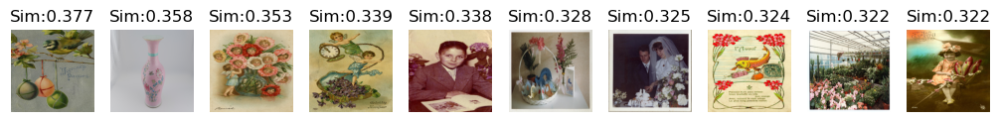

Caption: garden
Text features: (1, 3, 256)
(599, 32, 1) 0.42977792
1 Maaseikplein
2 Buurtpark Duifhuisstraat
3 Boerderijpark
4 Buurtpark Duifhuisstraat
5 Rommelwaterpark
6 Rommelwaterpark
7 Visserijpark
8 Luizengevecht
9 Koning Albertpark
10 Koningin Astridpark


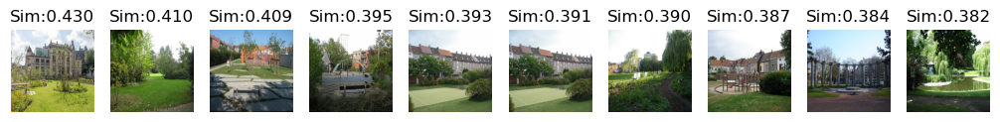

(39091, 32, 1) 0.41952708
1 Gent: Galgenberg, 1975-1990
2 Sint-Martinuskerk, Drongen
3 Man en vrouw met hond op bank, Aalst, ca. 1937-1939
4 Heilig Kruiskerk, Sint-Kruis-Winkel
5 Huwelijk Martine en Luk, 1970
6 Sint-Catharinakerk, Vroonstalledries, Wondelgem
7 Meisje met hond in tuin, ca. 1937
8 Schoolportret op pony, Sint-Amandsberg, 1969
9 Schoolportret van zussen en broer op pony, basisschool Melsen, 1970
10 Meisje bij verjaardagstaart, 1956


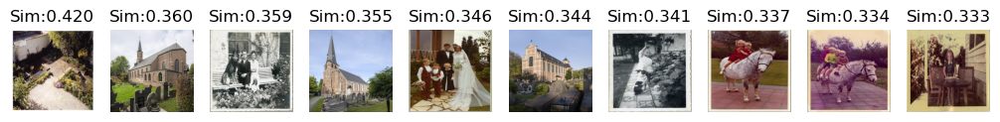

Caption: cycling
Text features: (1, 3, 256)
(599, 32, 1) 0.33710298
1 Halfwegpark
2 Pierkespark
3 Coupurepark
4 Zuiderpoortpark
5 De Passanten
6 Welkom in het park Halfweg
7 Sint-Baafskouter
8 Weerstandsplein
9 Groenzone Tuinwijk Malem
10 Sint-Baafskouter


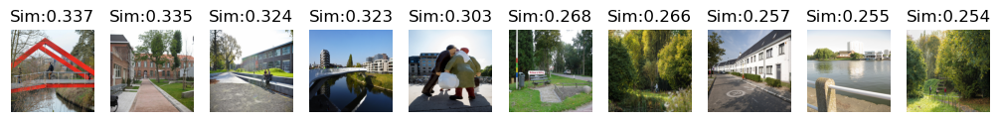

(39091, 32, 1) 0.3861923
1 Albert Buysse poseert op fiets
2 Arnold Vander Haeghen op zijn fiets, Gent, 1898
3 Drie personen poseren bij de fiets, Frankrijk
4 Kermisfoto op het Sint-Pietersplein, Gent
5 Elixir Dentrifice
6 Kinderen op fietsen
7 Leonie Souka op de fiets, Gent, 1900
8 Leonie Souka op haar fiets, Gent, 1900
9 Toeristen met tandems in berglandschap, Vogezen, 1936
10 Wielrenners aan de startlijn in een openluchtpiste


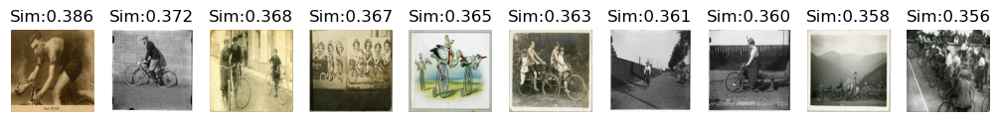

Caption: fries
Text features: (1, 3, 256)
(599, 32, 1) 0.26785806
1 Lousbergspark
2 Ekkergempark
3 Lousbergspark
4 Ekkergempark
5 SMAAKLIK
6 Banierpark
7 Olympiadepark
8 Guido Moonspark
9 De school van toen
10 Bellevuepark


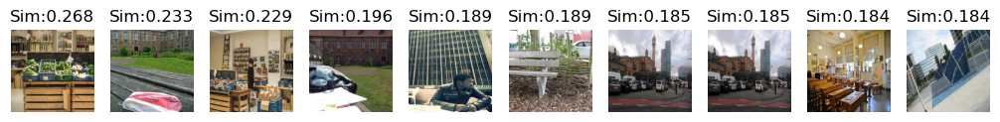

(39091, 32, 1) 0.32838696
1 77 recettes de Raymond Oliver pour la Fritex - 77 recepten van Raymond Oliver bij uw Fritex
2 Frietsnijder
3 Kaasrecepten
4 Keus van gewestelijke recepten en nationale gerechten
5 Affiche voor Circus Piste
6 Spoelmachine van het merk Schärer
7 Karmelietenkerk, Gent
8 Fritex Nova : de electrische friteuse met regelbare temperatuur
9 Smeedijzeren weefkam
10 Fragmenten spijkers in ijzer


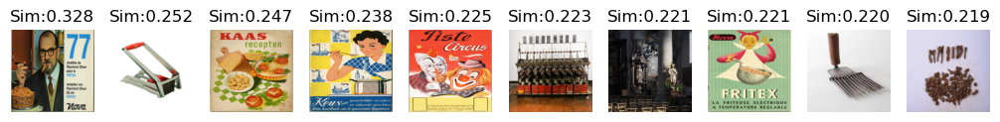

Caption: chocolate
Text features: (1, 3, 256)
(599, 32, 1) 0.32697034
1 Daskalidès Pralines
2 Daskalidès Pralines
3 Daskalidès Pralines
4 Daskalidès Pralines
5 Daskalidès Pralines
6 Groenzone Tuinwijk Malem
7 Daskalidèspark
8 Caermersklooster
9 De Stervende Gladiator
10 Ros Beiaard


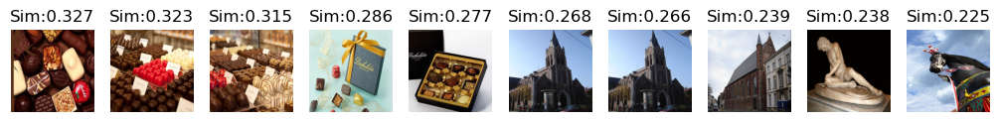

(39091, 32, 1) 0.39555788
1 Reclame voor paaseieren van Cote D'Or
2 Nep stuk chocolade met reclame voor Walters' Palm Toffee
3 Handfruitpers of citruspers in bakeliet
4 Imitatiehoutblokken voor in een gashaard
5 Adreskaart van bakker Langenbick - De Splenter, Gent
6 Reclame voor Chocolat Suchard Milka
7 Elektrisch scheerapparaat van het merk Philips
8 The Chocolate Soldier | Le soldat de chocolat, Novy, Gent, 19 - 25 september 1947
9 The Chocolate Soldier │ Le soldat de chocolat, Gent, november 1947
10 Twee paar bruine nylonkousen met naad


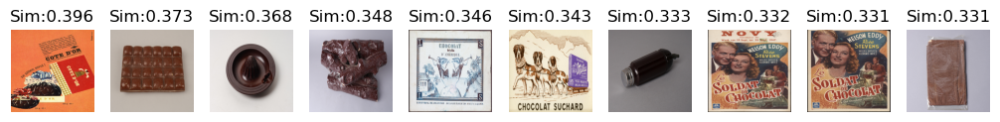

Caption: architecture
Text features: (1, 3, 256)
(599, 32, 1) 0.37414804
1 Maaseikplein
2 Groenzone Tuinwijk Malem
3 Hippolyte Metdepenningen
4 Daskalidèspark
5 Caermersklooster
6 Begijnhofdriespark
7 Guido Moonspark
8 Olympiadepark
9 Caermersklooster
10 Park de Pélichy


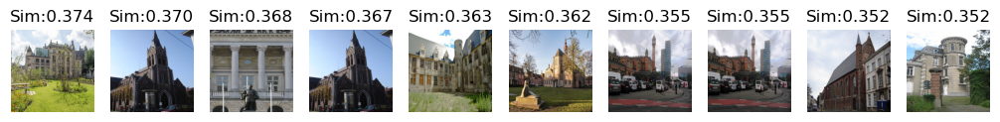

(39091, 32, 1) 0.39996755
1 Onze Lieve Vrouwkerk, Sint-Pietersplein, Gent
2 Sint-Niklaaskerk, Gent
3 Onze Lieve Vrouwkerk, Mariakerke
4 Sint-Niklaaskerk, Gent
5 Sint-Michielskerk, Gent
6 Karmelietenkerk, Gent
7 Sint-Martinuskerk, Ekkergem
8 Sint-Jacobskerk, Gent
9 Gent: Grootkanonplein, 1975-1990
10 Sint-Catharinakerk, Vroonstalledries, Wondelgem


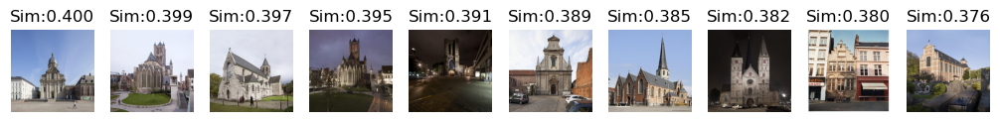

Caption: Ghent
Text features: (1, 3, 256)
(599, 32, 1) 0.41300964
1 Appelbrugparkje
2 Infokantoor Toerisme Gent
3 HD 400
4 Caermersklooster
5 Daskalidèspark
6 De Blauwe Vogels
7 De Blauwe Vogels
8 Coyendanspark
9 De Blauwe Vogels
10 Infokantoor Toerisme Gent


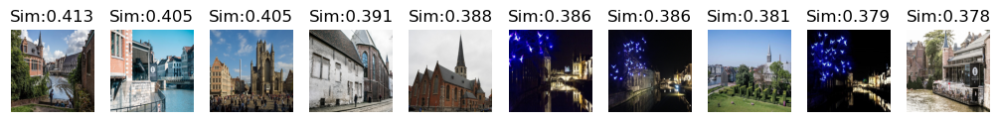

(39091, 32, 1) 0.4234376
1 Gent: Graslei, 1975-1990
2 Gent: Graslei, zonder datum
3 Gent: Graslei, zonder datum
4 Gent: Graslei: Korenmetershuis en Gildehuis der Vrije Schippers, zonder datum
5 Gent: Graslei: Gildehuis der Vrije Schippers en Sint-Niklaaskerk, na 1897
6 Gent: Graslei, na 1899
7 Gent: Graslei, zonder datum
8 Gent: Graslei, 1903 - 1921
9 Gent: Graslei, 1917
10 Gent: Graslei, zonder datum


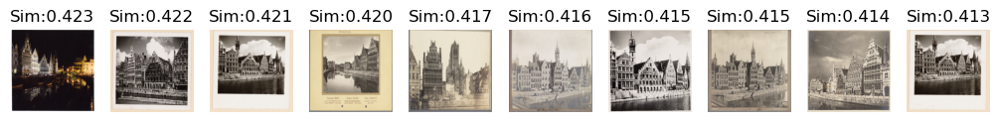

In [75]:
for i,c in enumerate(captions):
    print(f'Caption: {c}')
    text_feature = features_text[i]
    print('Text features:',text_feature.shape)
    #text_feature = text_feature[:,0,:]
   
    best_matches, best_sims = most_similar_text(text_feature, poi_features, k=k)
    
    plt.figure(figsize=(14,20))
    for j in range(len(best_matches)):
        
        idx = best_matches[j]
        sim = best_sims[j]
        
        fname = poi_filenames[idx]
        
        print(j+1,get_poi(pois, fname)['name'])
        img_path = os.path.join(poi_img_dir, poi_filenames[idx])
        plt.subplot(1,k+1,j+1)
        plt.imshow(read_resize_img(img_path))
        plt.axis('off')
        plt.title(f'Sim:{sim:.3f}',fontsize=12)
    plt.show()
    
    best_matches, best_sims = most_similar_text(text_feature, features, k=k)
    
    plt.figure(figsize=(14,20))
    for j in range(len(best_matches)):
        idx = best_matches[j]
        sim = best_sims[j]
        
        fname = filenames[idx]
        title = json_data[fname]['title'][0]
        print(j+1,title['value'])
        img_path = os.path.join(img_dir, filenames[idx])
        plt.subplot(1,k+1,j+1)
        plt.imshow(read_resize_img(img_path))
        plt.axis('off')
        plt.title(f'Sim:{sim:.3f}',fontsize=12)
    plt.show()